<div dir="rtl">

# 📊 گزارش کلی

در این نوت بوک با استفاده از تعدادی کتابخانه‌های پایتون که به شرح زیر هستند،پردازش هایی روی یکسری تصویر انجام داده ام که در ادامه توضیحات کلی بهمراه کد آنها موجود می باشد:

## 🛠 کتابخانه‌های استفاده‌شده

| کتابخانه | کاربرد |
|----------|--------|
| `cv2` (OpenCV) | خواندن، نوشتن، تبدیل و نمایش تصاویر |
| `numpy` | محاسبات ماتریسی و آماری مانند میانه |
| `google.colab.patches` | نمایش تصاویر در محیط Google Colab با `cv2_imshow` |
| `IPython.display` | برای نمایش‌های پیشرفته‌تر (استفاده جزئی شده) |

---

## ۱. بارگذاری تصویر و تولید نسخه‌های مختلف آن

### تابع `process_and_display_image`

- **ورودی:** مسیر یک تصویر ورودی (`image_path`)
- **مراحل انجام شده:**
  - بارگذاری تصویر اصلی با `cv2.imread`
  - تبدیل تصویر به  Grayscale با استفاده از `cv2.cvtColor`
  - اعمال Thresholding برای تبدیل تصویر به نسخه  Binary
  - ذخیره نسخه‌های مختلف تصویر (رنگی، خاکستری، دودویی) با `cv2.imwrite`
  - نمایش تصاویر با استفاده از `cv2_imshow`

</div>


Original Image:


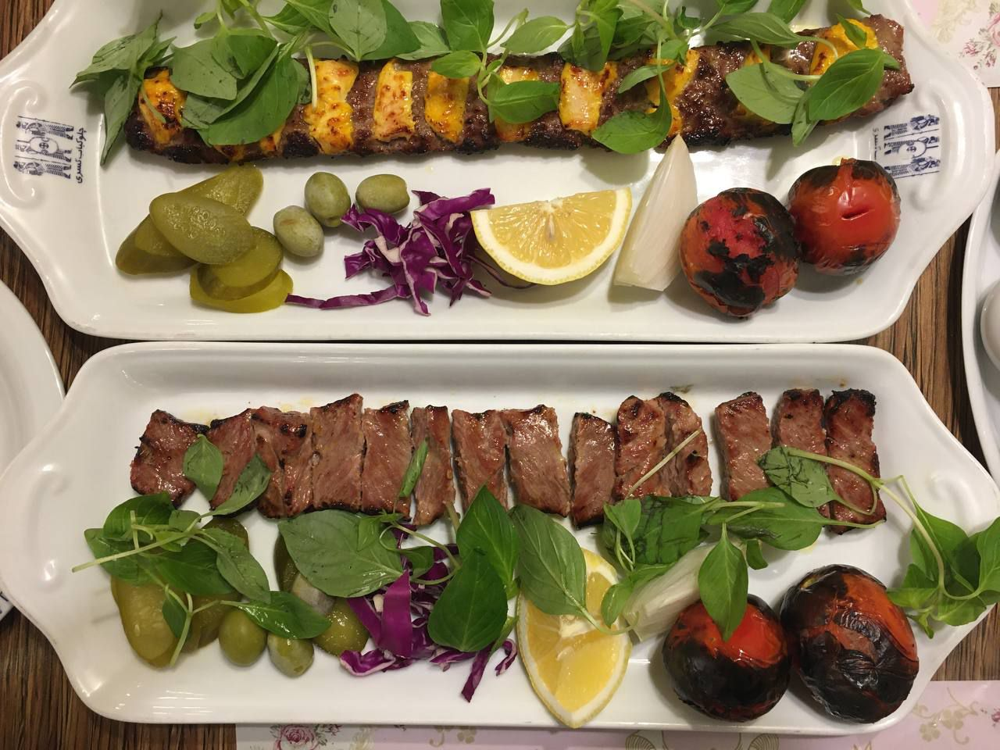

Gray Scale Image:


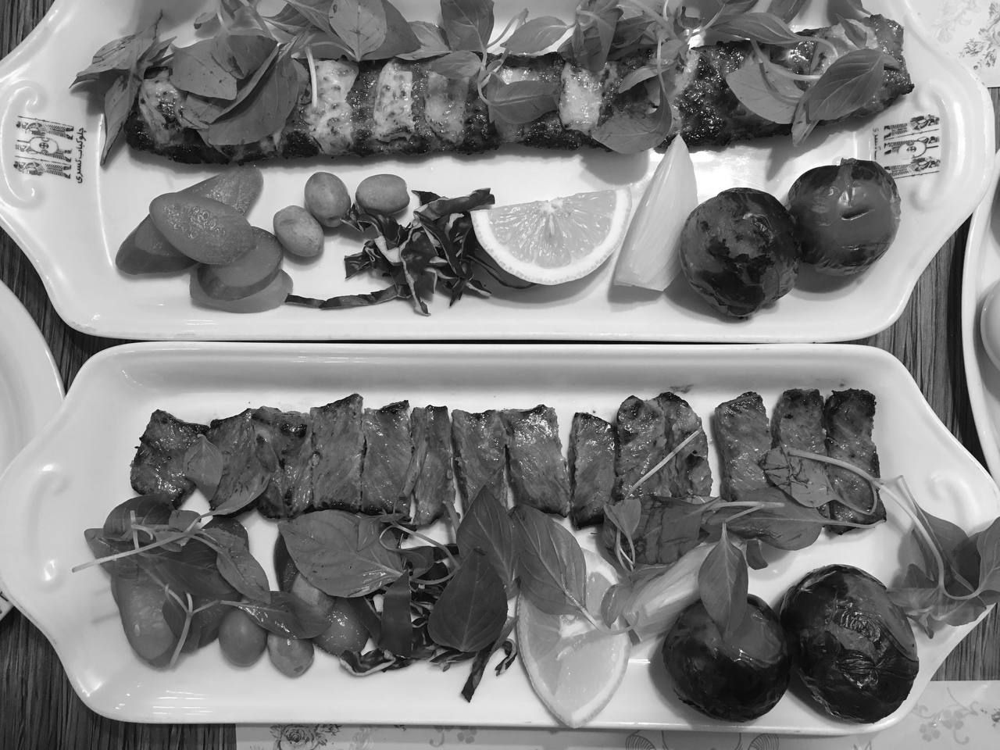

Binary Image:


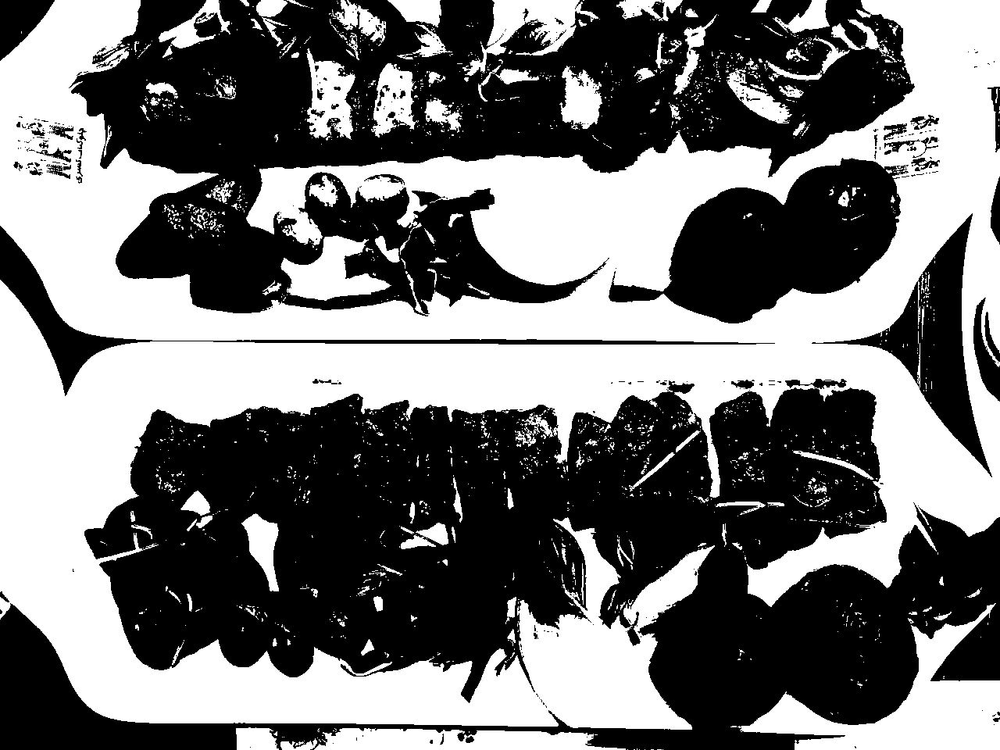

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from IPython.display import display, Image
threshold=127

def process_and_display_image(image_path):
    original_image = cv2.imread(image_path)
    if original_image is None:
        print("Error: Could not load image from the path")
        return


    gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
    _, binary_image = cv2.threshold(gray_image, threshold, 255, cv2.THRESH_BINARY)

    cv2.imwrite("colored.jpg", original_image)
    cv2.imwrite("gray.jpg", gray_image)
    cv2.imwrite("binary.jpg", binary_image)

    print("Original Image:")
    cv2_imshow(original_image)
    print("Gray Scale Image:")
    cv2_imshow(gray_image)
    print("Binary Image:")
    cv2_imshow(binary_image)

    # Wait for a key press and then close all windows
    cv2.waitKey(0)
    cv2.destroyAllWindows()

my_image_path = '/content/1008219287_57058009.jpg'
process_and_display_image(my_image_path)

<div dir="rtl">

## ۲. افزایش و کاهش کنتراست تصویر

### تابع `adjust_contrast`

- **ورودی‌ها:**
  - تصویر ورودی (رنگی یا خاکستری)
  - ضریب کنتراست (مثلاً: 1.5 یا 0.6)
- **نحوه عملکرد:**
  - محاسبه میانه‌ی تصویر به‌عنوان نقطه مرجع جهت تغییر کنتراست
  - تغییر کنتراست با فرمول:

    adjusted = (image - median) * factor + median
  - محدود کردن مقادیر پیکسل به بازه ۰ تا ۲۵۵ و تبدیل به `uint8`

### تابع `process_contrast`

- بارگذاری تصاویر رنگی و خاکستری
- اعمال افزایش و کاهش کنتراست با ضرایب:
  - **افزایش کنتراست:** ضریب 1.5
  - **کاهش کنتراست:** ضریب 0.6
- ذخیره و نمایش نتایج در ۴ تصویر:
  - `colored_inc_cons.jpg` و `colored_dec_cons.jpg`
  - `gray_inc_cons.jpg` و `gray_dec_cons.jpg`

</div>

colored Increased Contrast:


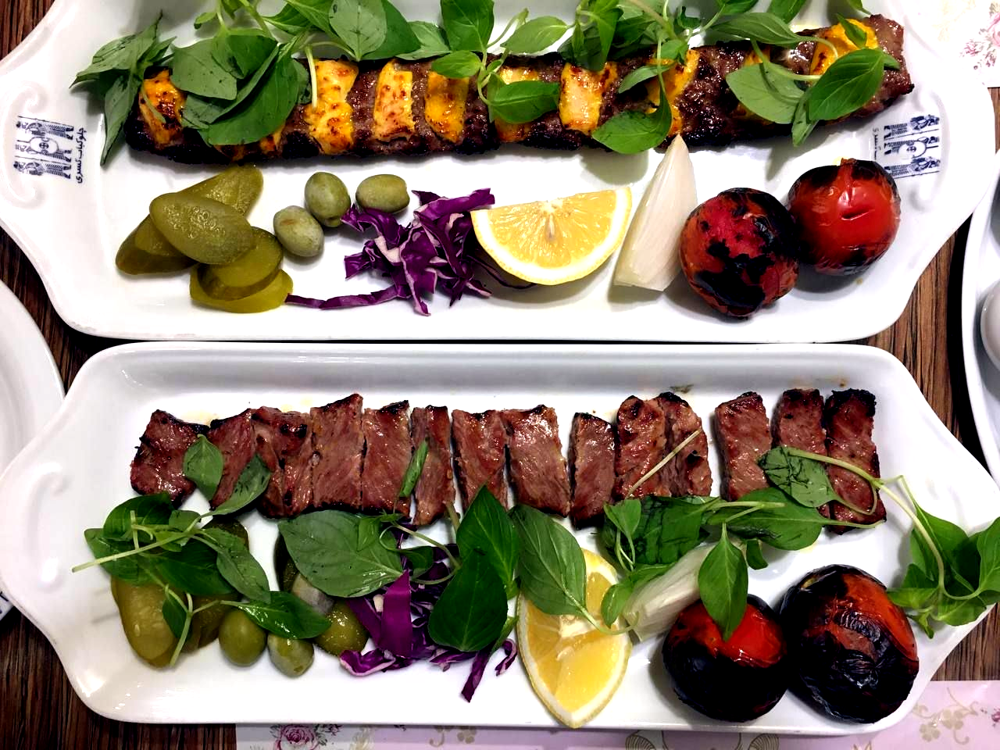

colored Decreased Contrast:


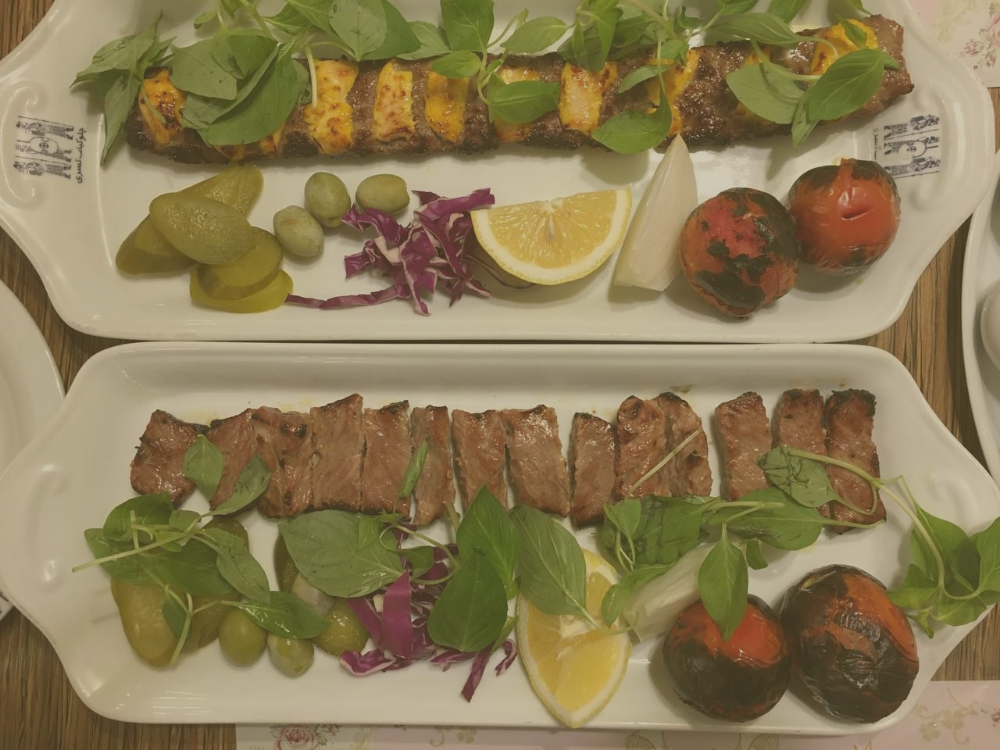

gray Increased Contrast:


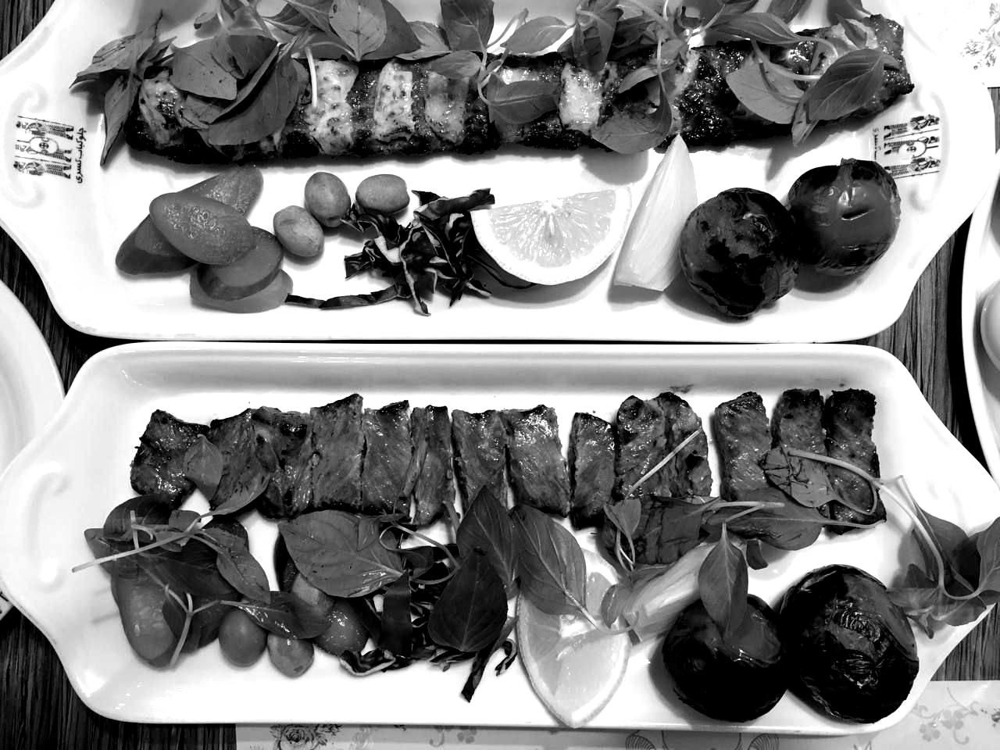

gray Decreased Contrast:


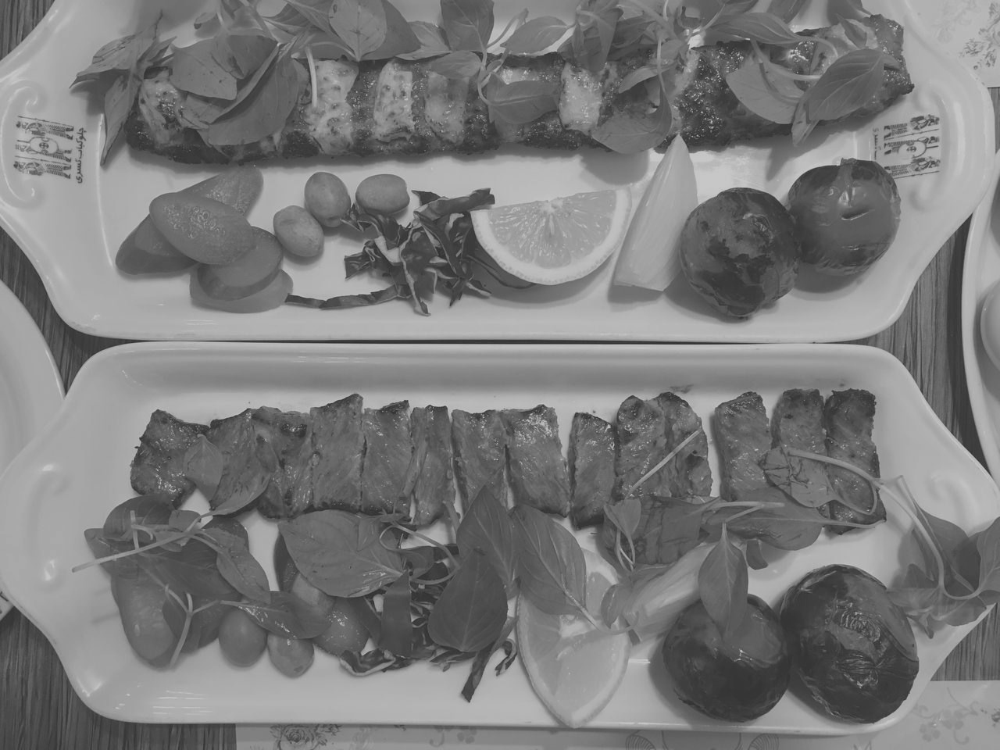

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import os

def adjust_contrast(image, factor):
    if len(image.shape) == 3:
        img_float = image.astype(np.float32)
        median = np.median(img_float, axis=(0,1))
        adjusted = (img_float - median) * factor + median
    else:
        median = np.median(image)
        adjusted = (image.astype(np.float32) - median) * factor + median

    return np.clip(adjusted, 0, 255).astype(np.uint8)

def process_contrast(colored_path, gray_scale_path):
    original = cv2.imread(colored_path)
    gray = cv2.imread(gray_scale_path)
    if (original is None) or (gray is None):
        print(f"Error loading image from the path")
        return

    for img, name in [(original, 'colored'), (gray, 'gray')]:
        increased = adjust_contrast(img, 1.5)
        decreased = adjust_contrast(img, 0.6)

        cv2.imwrite(name + '_inc_cons.jpg', increased)
        cv2.imwrite(name + '_dec_cons.jpg', decreased)

        print(name + " Increased Contrast:")
        cv2_imshow(increased)
        print(name + " Decreased Contrast:")
        cv2_imshow(decreased)

process_contrast('/content/colored.jpg', '/content/gray.jpg')

<div dir="rtl">

## ۳. افزایش مقادیر (افزایش روشنایی) تصویر خاکستری

### تابع `increase_gray_values`

- **ورودی:** مسیر تصویر خاکستری و مقدار افزایش مقادیر (۲۰)
- **عملیات:**
  - خواندن تصویر خاکستری با `cv2.IMREAD_GRAYSCALE`
  - استفاده از `cv2.add` برای افزودن مقدار ثابت (۲۰) به تمامی پیکسل‌ها
  - ذخیره تصویر خروجی با نام `gray_inc_20.jpg`

</div>

Increase gray_scale by 20:


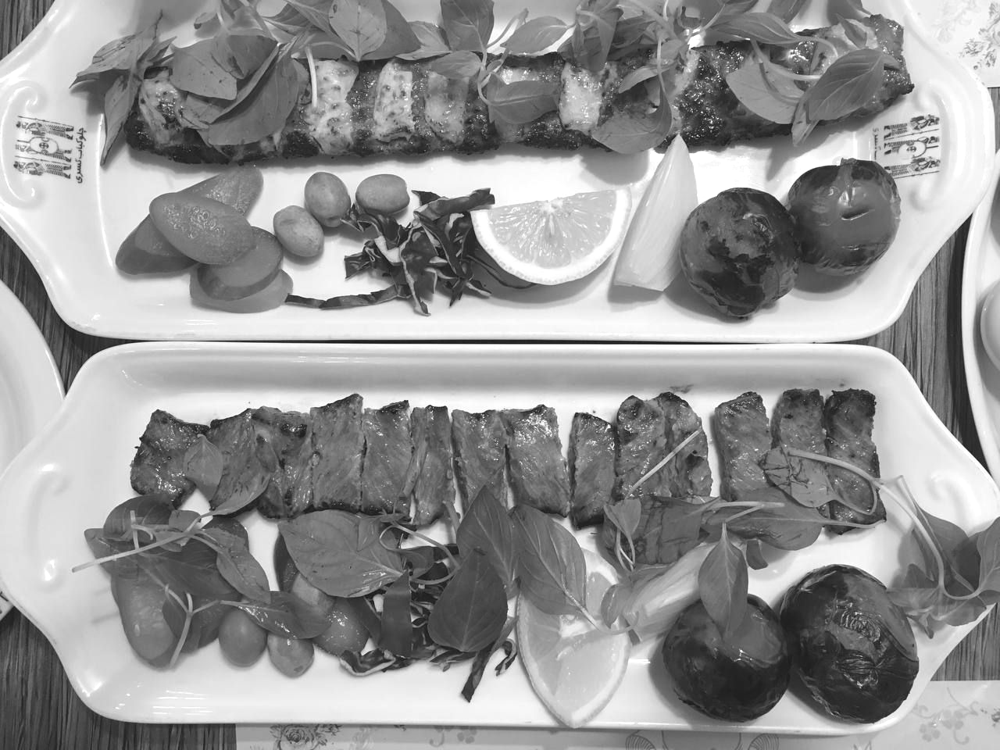

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import os

def increase_gray_values(image_path, increment=20):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print("Error: Could not load image from the path")
        return

    increased_img = cv2.add(img, 20)
    cv2.imwrite("gray_inc_20.jpg", increased_img)

    print(f"Increase gray_scale by {increment}:")
    cv2_imshow(increased_img)

increase_gray_values('/content/gray.jpg')

<div dir="rtl">

## 🎛 افزودن نویز فلفل نمکی به تصویر رنگی (RGB)

### تابع `add_salt_and_pepper_rgb`

این تابع نویز تصادفی از نوع فلفل نمکی را به تصویر رنگی اضافه می‌کند. عملکرد آن به شرح زیر است:

- ابتدا یک کپی از تصویر اصلی ایجاد می‌شود.
- **نویز نمک (پیکسل سفید):** به‌صورت تصادفی برخی از پیکسل‌ها به مقدار `255` در هر کانال (RGB) تغییر می‌یابند.
- **نویز فلفل (پیکسل سیاه):** به‌صورت تصادفی برخی دیگر از پیکسل‌ها به مقدار `0` در هر کانال تغییر داده می‌شوند.
- تعداد این پیکسل‌ها متناسب با مقدار احتمال (`prob`) تعیین می‌شود. مقدار پیش‌فرض آن `0.05` (۵٪) است.

---

### تابع `process_rgb_with_noise`

- تصویر رنگی از مسیر داده‌شده بارگذاری می‌شود.
-  تابع نویز در آن صدا زده می شود.
- تصویر نهایی حاوی نویز با نام `colored_salt_and_pepper.jpg` ذخیره می‌شود.
- تصویر خروجی در نمایش داده می‌شود.

</div>


Image with Salt-and-Pepper Noise:


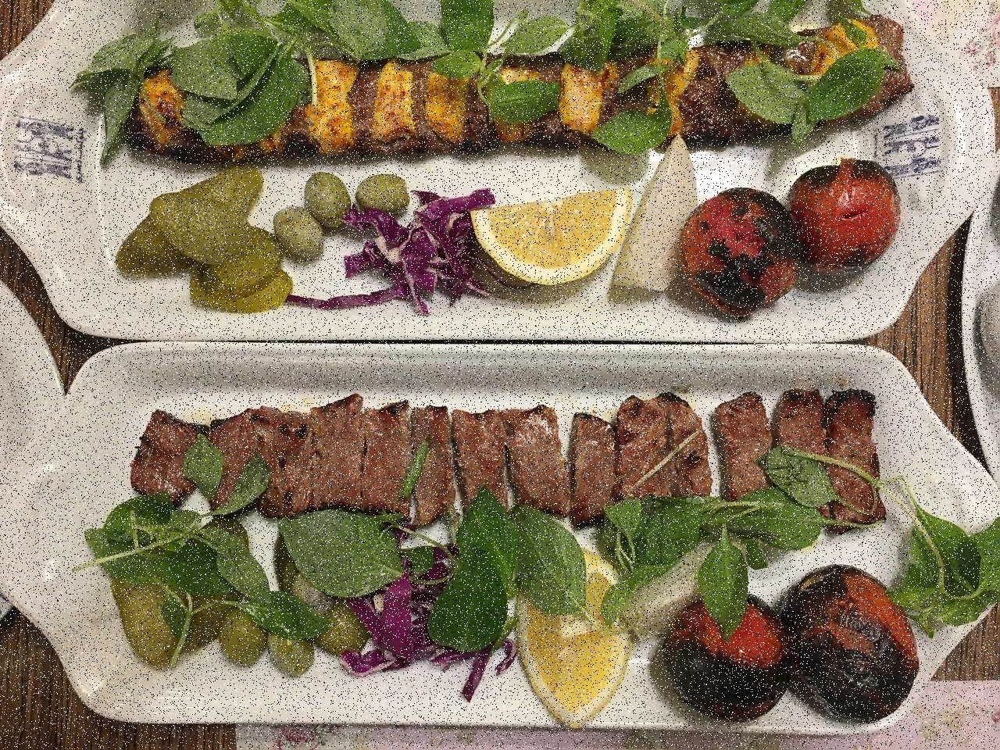

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import random

def add_salt_and_pepper_rgb(image, prob=0.05):
    output = np.copy(image)
    num_pixels = np.ceil(prob * image.size / 3)

    # Salt noise (white pixels)
    coords = [np.random.randint(0, i-1, int(num_pixels)) for i in image.shape[:2]]
    output[coords[0], coords[1], :] = 255

    # Pepper noise (black pixels)
    coords = [np.random.randint(0, i-1, int(num_pixels)) for i in image.shape[:2]]
    output[coords[0], coords[1], :] = 0

    return output

def process_rgb_with_noise(image_path, noise_amount=0.05):
    original = cv2.imread(image_path)
    if original is None:
        print("Error loading image from the path")
        return

    # Add noise
    noisy_rgb = add_salt_and_pepper_rgb(original, noise_amount)
    cv2.imwrite("colored_salt_and_pepper.jpg", noisy_rgb)

    print("Image with Salt-and-Pepper Noise:")
    cv2_imshow(noisy_rgb)


process_rgb_with_noise('/content/colored.jpg', noise_amount=0.05)